# Image Filtering: Spatial vs Frequency Domain — Hands-on Notebook

This notebook contains theory and runnable code examples for:
- Noise models (Gaussian, Salt & Pepper)
- Spatial-domain filters: median, Gaussian (manual + OpenCV), bilateral
- Frequency-domain filtering using FFT (Gaussian LPF/HPF)

Run the cells in order. Change parameters in the **Try-it** cells to explore.

In [1]:
# Basic imports
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import convolve
from scipy.signal import medfilt2d
import os

from numpy.fft import fft2, ifft2, fftshift
import cv2
import time


In [2]:
# Helper functions: load image, noise addition, metrics, kernels

def load_gray_image(path=None):
    """ Load a grayscale image normalized to [0,1] """
    im = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    print(im.shape)
    return im.astype(np.float32)/255.0

def add_gaussian_noise(image, mean=0.0, var=0.2):
    sigma = np.sqrt(var)
    gauss = np.random.normal(mean, sigma, image.shape).astype(np.float32)
    noisy = image + gauss
    return np.clip(noisy, 0.0, 1.0)

def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy = image.copy()
    # Salt
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_salt) for i in image.shape)
    noisy[tuple(coords)] = 1.0
    # Pepper
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_pepper) for i in image.shape)
    noisy[tuple(coords)] = 0.0
    return noisy

def gaussian_kernel(size, sigma=1.0):
    ax = np.arange(-size//2 + 1., size//2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel


## 1) Noise models

We will demonstrate two common noise models:

- **Gaussian noise**: additive zero-mean Gaussian with variance $\sigma^2$.
- **Salt & Pepper noise**: random pixels set to 0 (pepper) or 1 (salt).

Change the variance and observe how filtering performance changes.

(256, 256)


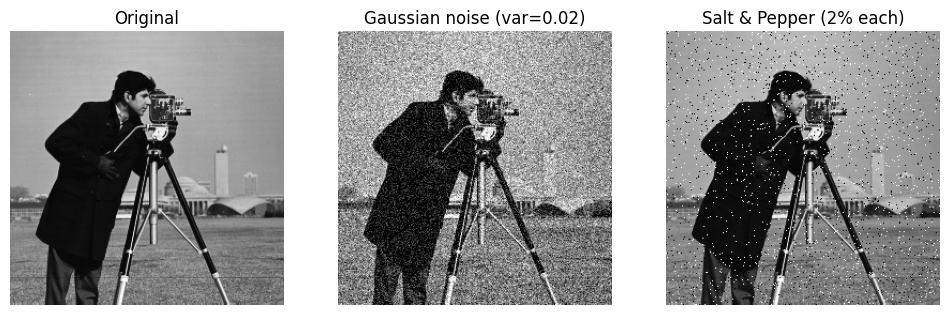

In [3]:
# Load image and show noisy versions
img = load_gray_image("cameraman.jpeg")
np.random.seed(0)

img_gauss = add_gaussian_noise(img, var=0.02)
img_sp = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(img_gauss, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(img_sp, cmap='gray'); plt.title('Salt & Pepper (2% each)'); plt.axis('off')
plt.show()

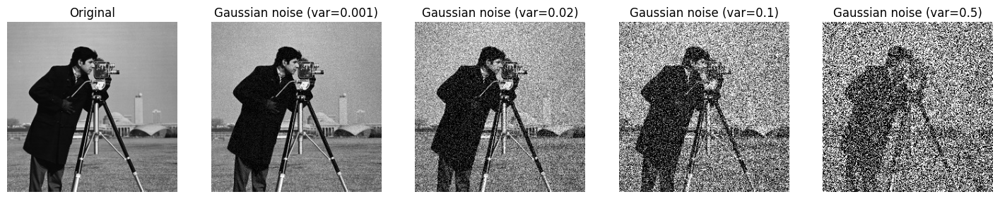

In [4]:
img_gauss_smallest = add_gaussian_noise(img, var=0.001)
img_gauss_small = add_gaussian_noise(img, var = 0.02)
img_gauss_med = add_gaussian_noise(img, var = 0.1)
img_gauss_large = add_gaussian_noise(img, var = 0.5)

plt.figure(figsize=(18, 12))
plt.subplot(1,5,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,5,2); plt.imshow(img_gauss_smallest, cmap='gray'); plt.title('Gaussian noise (var=0.001)'); plt.axis('off')
plt.subplot(1,5,3); plt.imshow(img_gauss_small, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,5,4); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noise (var=0.1)'); plt.axis('off')
plt.subplot(1,5,5); plt.imshow(img_gauss_large, cmap='gray'); plt.title('Gaussian noise (var=0.5)'); plt.axis('off')
plt.show()

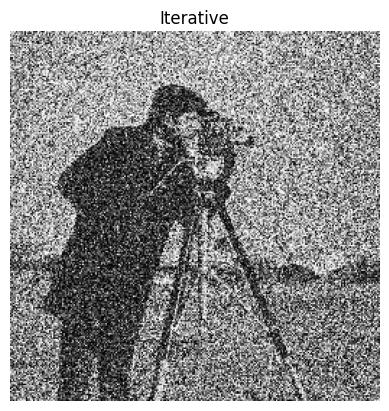

In [5]:
n = 100
img_gauss_n = np.copy(img)
for i in range(n):
    img_gauss_n = add_gaussian_noise(img_gauss_n, var = 0.001)
plt.imshow(img_gauss_n, cmap = 'gray'); plt.title('Iterative'); plt.axis('off')
plt.show()

## 2) Spatial-domain filters

**Box Filter**: Kernel has all values as the same

**Gaussian filter** (linear): convolution with a Gaussian kernel; good for smoothing Gaussian noise. Kernel equation:

$$
G(x,y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2+y^2}{2\sigma^2}}
$$

**Bilateral filter**: edge-preserving filter that weights both spatial distance and intensity difference.

### Bilateral Filter

The bilateral filter computes the output intensity at a pixel $p$ as:

$$
I_{out}(p) = \frac{1}{W_p} \sum_{q \in \Omega} I(q) \;
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$

where:

- $I(p)$ : intensity at pixel $p$  
- $\Omega$ : neighborhood around $p$  
- $\sigma_s$ : spatial smoothing parameter (`sigmaSpace`)  
- $\sigma_r$ : range smoothing parameter (`sigmaColor`)  
- $W_p$ : normalization term, given by  

$$
W_p = \sum_{q \in \Omega}
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$


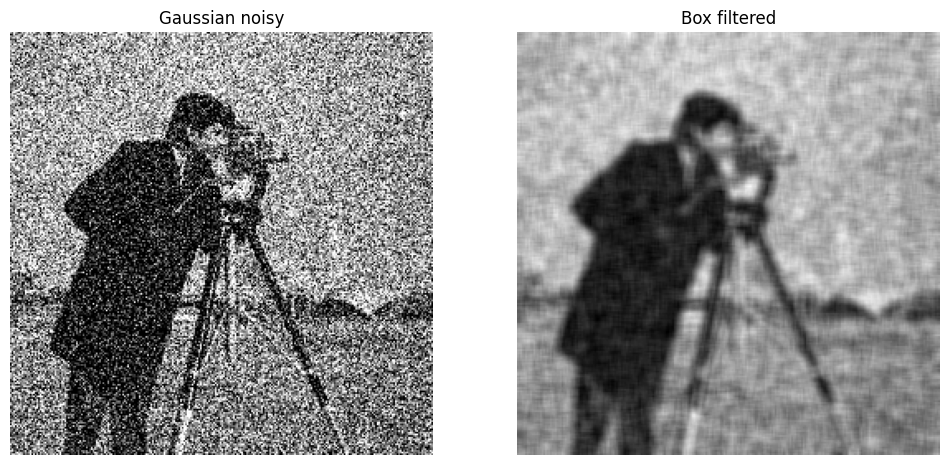

In [6]:
# Box Filter
N = 7
kern = np.ones((N, N)) / (N*N)
box_from_manual = convolve(img_gauss_med, kern, mode='reflect')

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.show()

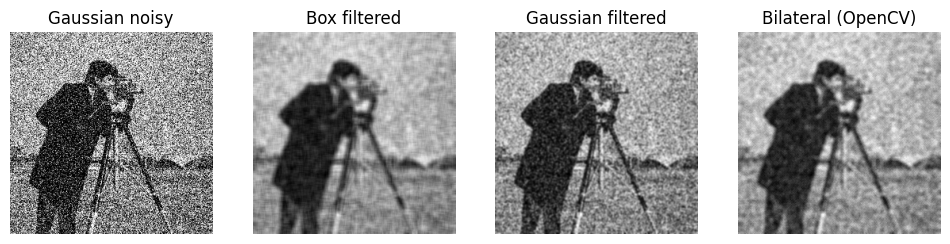

In [7]:
# Gaussian filter manual (convolution)
kern = gaussian_kernel(7, sigma=1)
gauss_from_manual = convolve(img_gauss_med, kern, mode='reflect')
# Bilateral filter (OpenCV) on u8
bilat = cv2.bilateralFilter(img_gauss_med, d=7, sigmaColor=75, sigmaSpace=75).astype(np.float32)/255.0

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,4,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,4,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.subplot(1,4,3); plt.imshow(gauss_from_manual, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(bilat, cmap='gray'); plt.title('Bilateral (OpenCV)'); plt.axis('off')
plt.show()

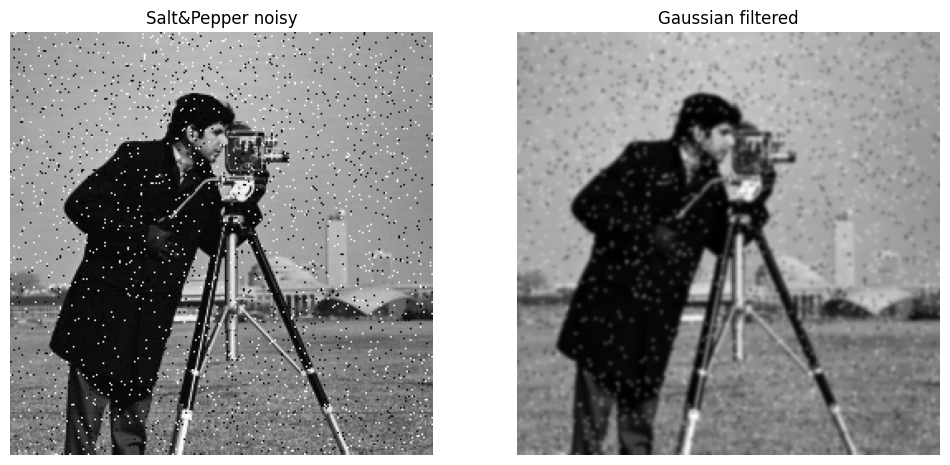

In [8]:
gauss_sp = convolve(img_sp, kern, mode='reflect')

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(gauss_sp, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.show()

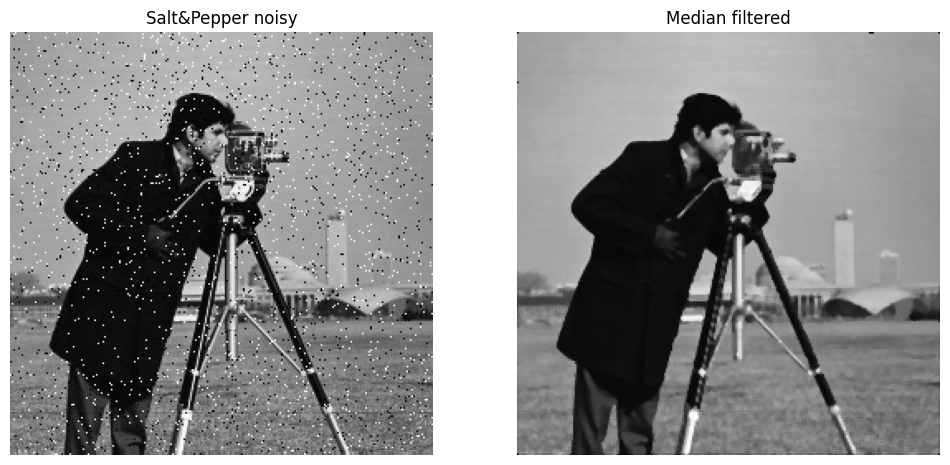

In [9]:
med_sp = medfilt2d(img_sp, kernel_size=3)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(med_sp, cmap='gray'); plt.title('Median filtered'); plt.axis('off')
plt.show()

Manual Median Filter Time: 1.8006 s
SciPy medfilt2d Time: 0.0089 s
Max Pixel Difference: 0.615686297416687


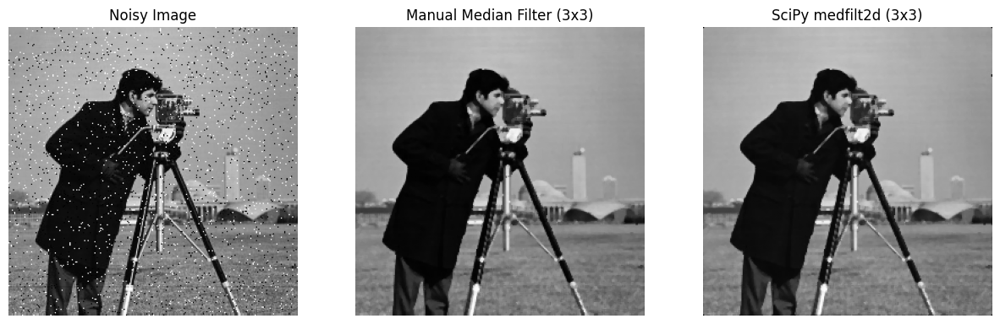

In [10]:

noisy_img = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)
# -------------------- Manual Median Filter --------------------
def manual_median_filter(image, kernel_size=3):
    pad = kernel_size // 2
    padded = np.pad(image, pad, mode='edge')
    output = np.zeros_like(image)

    H, W = image.shape
    for i in range(H):
        for j in range(W):
            window = padded[i:i+kernel_size, j:j+kernel_size]
            output[i, j] = np.median(window)
    return output

# -------------------- Compare Speed --------------------
ksize = 3

# Manual filter
t1 = time.time()
manual_filtered = manual_median_filter(noisy_img, kernel_size=ksize)
t2 = time.time()

# Built-in medfilt2d
t3 = time.time()
scipy_filtered = medfilt2d(noisy_img, kernel_size=ksize)
t4 = time.time()

print(f"Manual Median Filter Time: {(t2 - t1):.4f} s")
print(f"SciPy medfilt2d Time: {(t4 - t3):.4f} s")
print(f"Max Pixel Difference: {np.abs(manual_filtered - scipy_filtered).max()}")

# -------------------- Plot Results --------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(noisy_img, cmap='gray')
axs[0].set_title("Noisy Image")
axs[0].axis("off")

axs[1].imshow(manual_filtered, cmap='gray')
axs[1].set_title(f"Manual Median Filter ({ksize}x{ksize})")
axs[1].axis("off")

axs[2].imshow(scipy_filtered, cmap='gray')
axs[2].set_title(f"SciPy medfilt2d ({ksize}x{ksize})")
axs[2].axis("off")

plt.show()


## 3) Frequency-domain filtering (FFT)

Fourier transform (2D discrete):

$$
F(u,v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y) e^{-j 2\pi (ux/M + vy/N)}
$$

We will build Gaussian low-pass and high-pass filters in the frequency domain. Steps:
1. Compute FFT of image
2. Shift zero-frequency to center (fftshift)
3. Multiply spectrum by filter mask
4. Inverse shift and inverse FFT



In [11]:
# Function to compute FFT and return fshift + magnitude spectrum
def compute_fft(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift) + 1)
    return fshift, magnitude_spectrum

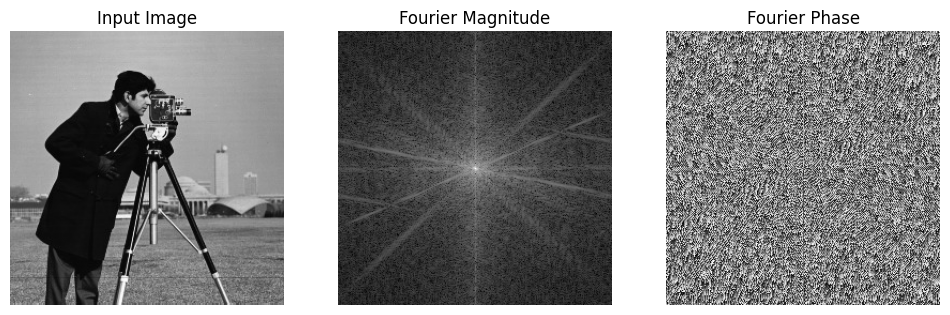

In [12]:
def plot_fourier(img):
    fshift_img, mag_img = compute_fft(img)
    phase = np.angle(fshift_img)
    plt.figure(figsize=(12, 6))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray', vmin = 0, vmax = 1)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(mag_img, cmap = 'gray')
    plt.title("Fourier Magnitude")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(phase, cmap="gray")
    plt.title("Fourier Phase")
    plt.axis('off')


plot_fourier(img)

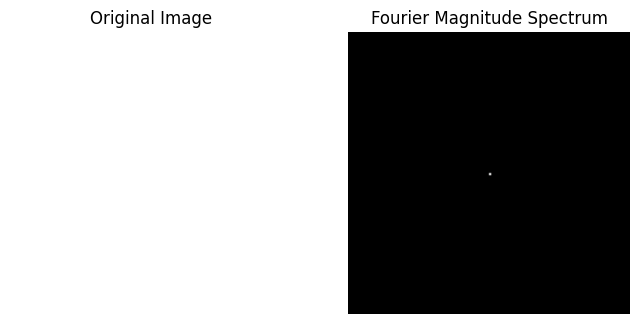

In [13]:
def save_and_plot_fft(img, img_name="image", spectrum_name="spectrum"):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log1p(np.abs(fshift))  # log scaling

    plt.imsave(f"{img_name}.png", img, cmap="gray", vmin=0, vmax=1)

    plt.imsave(f"{spectrum_name}.png", magnitude_spectrum, cmap="gray")

    plt.figure(figsize=(8,4))

    plt.subplot(1,2,1)
    plt.imshow(img, cmap="gray", vmin=0, vmax=1)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(magnitude_spectrum, cmap="gray")
    plt.title("Fourier Magnitude Spectrum")
    plt.axis("off")

    plt.show()

solid_image = np.ones(shape = (128, 128))
save_and_plot_fft(solid_image, "solid", "solid_spectrum")

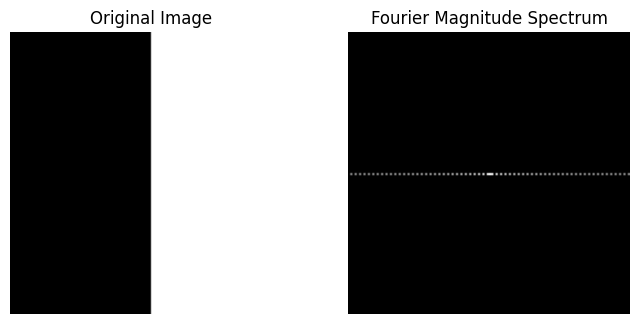

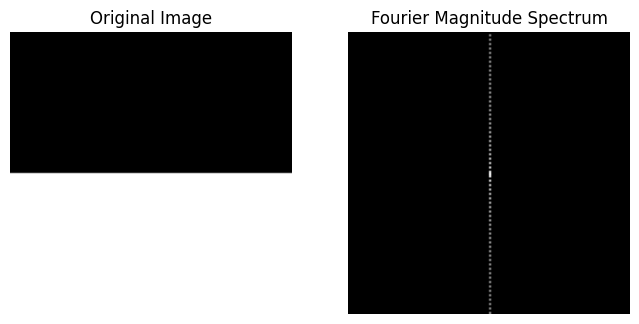

In [14]:
def step_edge_x(height=128, width=128):
    img = np.zeros((height, width))
    img[:, width//2:] = 1   # right half white
    return img

def step_edge_y(height=128, width=128):
    img = np.zeros((height, width))
    img[height//2:, :] = 1  # bottom half white
    return img

img_x = step_edge_x()
img_y = step_edge_y()
save_and_plot_fft(img_x, "stepx", "stepx_spectrum")
save_and_plot_fft(img_y, "stepy", "stepy_spectrum")

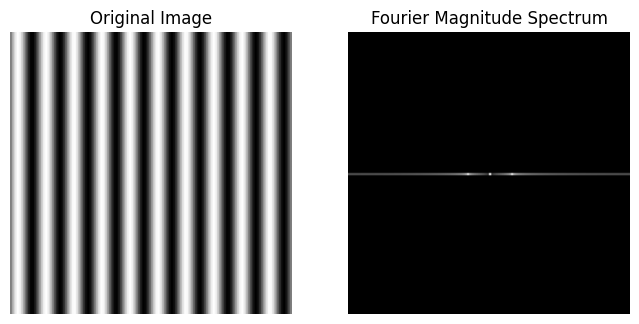

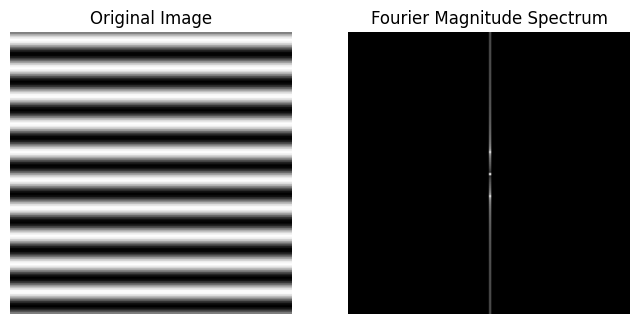

In [15]:
def sinusoidal_images(size=128, freq=5):
    x = np.linspace(0, 2*np.pi, size)
    y = np.linspace(0, 2*np.pi, size)
    xx, yy = np.meshgrid(x, y)

    # Sinusoid varying in x-direction (vertical stripes)
    x_sin = 0.5 * (1 + np.sin(freq * xx))  # normalize to [0,1]

    # Sinusoid varying in y-direction (horizontal stripes)
    y_sin = 0.5 * (1 + np.sin(freq * yy))  # normalize to [0,1]

    return x_sin, y_sin

# Example usage
xsin_img, ysin_img = sinusoidal_images(size=128, freq=10)
save_and_plot_fft(xsin_img, "sinx", "sinx_spectrum")
save_and_plot_fft(ysin_img, "siny", "siny_spectrum")

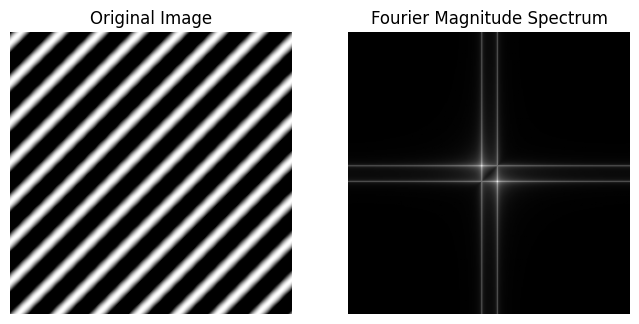

In [16]:
def generate_45deg_sinusoid(size=256, frequency=10):
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    coord = (X + Y) / np.sqrt(2)

    sinusoid = np.sin(2 * np.pi * frequency * coord / size)

    return sinusoid

# Example usage
sin45_img = generate_45deg_sinusoid(size=256, frequency=10)
save_and_plot_fft(sin45_img, "sin45", "sin45_spectrum")


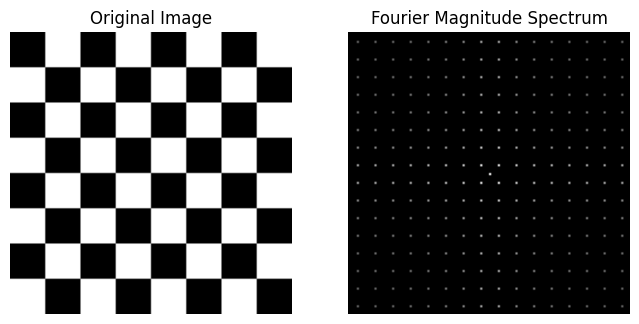

In [17]:
def generate_chessboard(size=256, num_squares=8):
    # Pixel grid
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    # Size of each square
    square_size = size // num_squares

    # Alternating pattern using integer division
    board = ((X // square_size) + (Y // square_size)) % 2

    return board

# Example usage
chessboard_img = generate_chessboard(size=128, num_squares=8)
save_and_plot_fft(chessboard_img, "chessboard", "chessboard_spectrum")

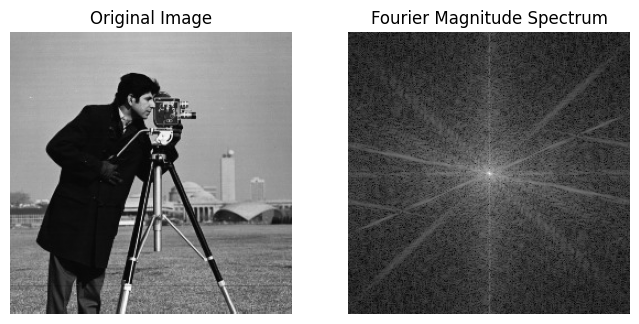

In [18]:
save_and_plot_fft(img, "cameraman", "cameraman_spectrum")

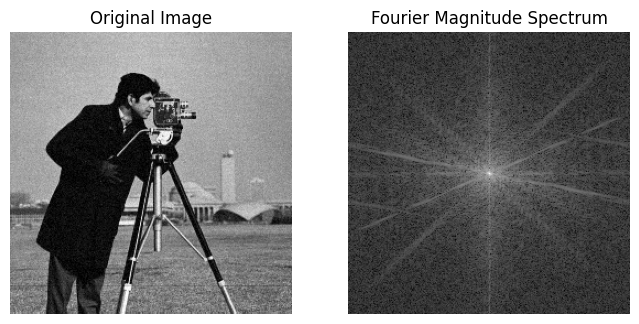

In [19]:
save_and_plot_fft(img_gauss_smallest, "camgauss", "camgauss_spectrum")

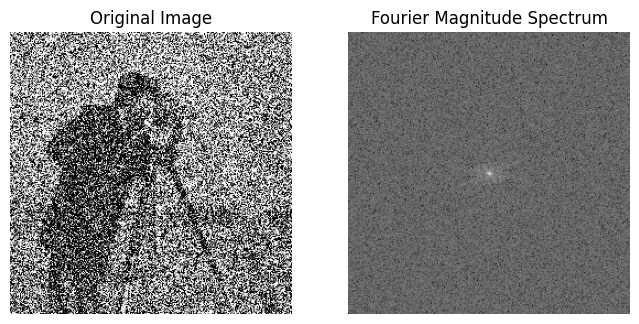

In [20]:
save_and_plot_fft(img_gauss_large, "camgauss", "camgauss_spectrum")

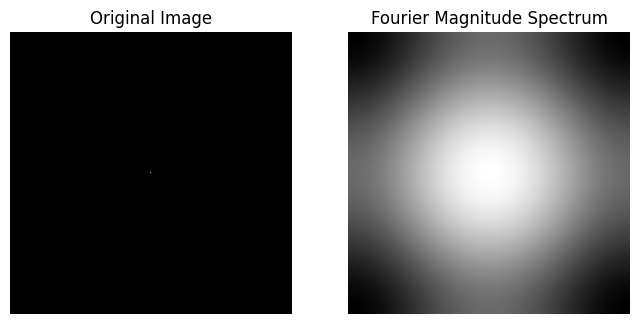

In [21]:
pad_kern = np.zeros_like(img, dtype=np.float32)
kern = gaussian_kernel(8, sigma=0.5)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2
plt.imsave("gauss_small.png", kern, cmap="gray")
pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern
save_and_plot_fft(pad_kern, "gauss", "gauss_spectrum")

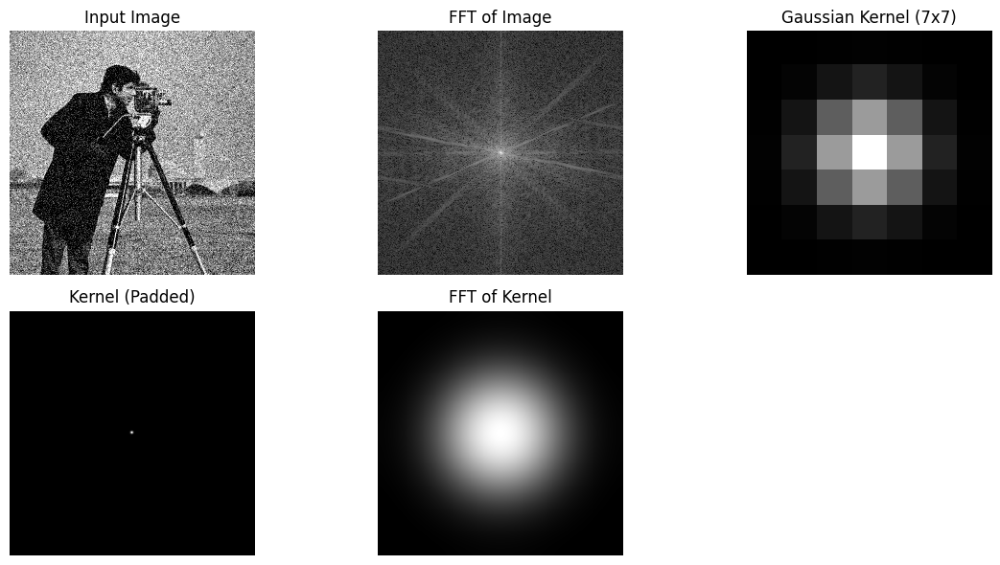

In [22]:
kern = gaussian_kernel(7, sigma=1)
# Pad kernel to match image size, centered
pad_kern = np.zeros_like(img, dtype=np.float32)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2

pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern


# Compute FFTs
fshift_img, mag_img = compute_fft(img_gauss_smallest)
fshift_kern, mag_kern = compute_fft(pad_kern)

# Plot results1
plt.figure(figsize=(12,6))

plt.subplot(2,3,1)
plt.imshow(img_gauss, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(mag_img, cmap='gray')
plt.title("FFT of Image")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(kern, cmap='gray')
plt.title("Gaussian Kernel (7x7)")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(pad_kern, cmap='gray')
plt.title("Kernel (Padded)")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(mag_kern, cmap='gray')
plt.title("FFT of Kernel")
plt.axis('off')

plt.tight_layout()
plt.show()

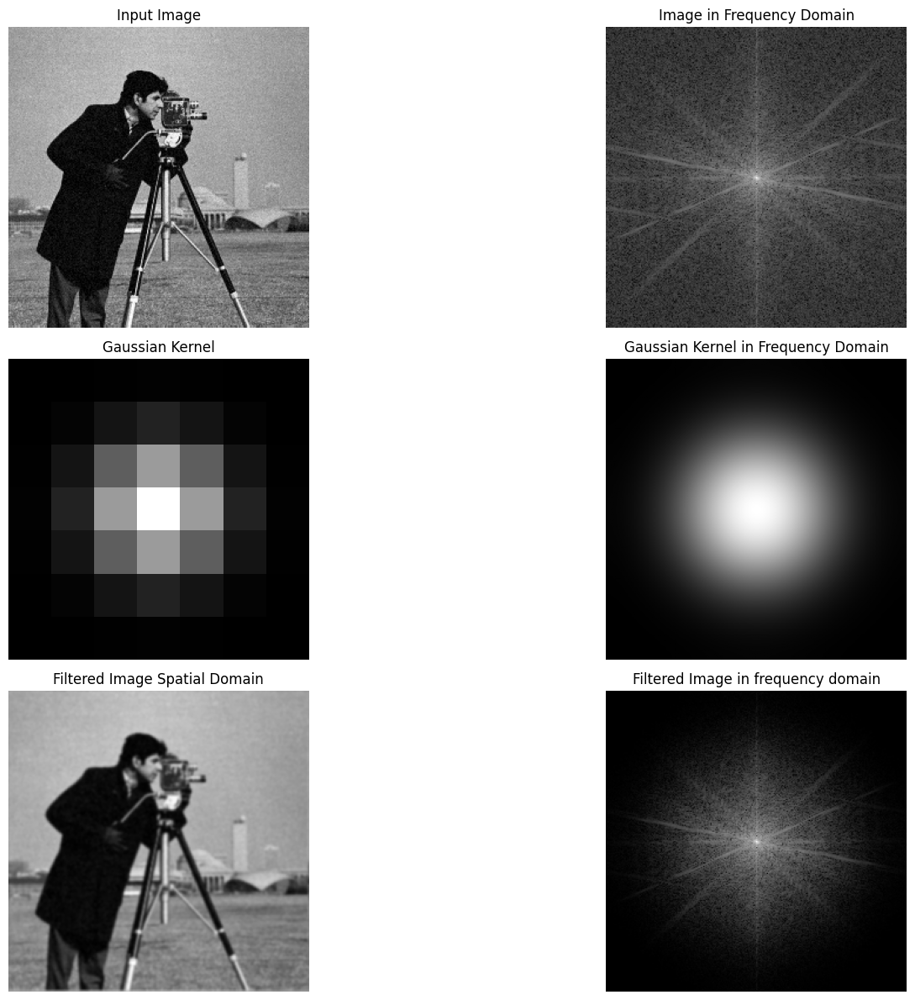

In [23]:
# Filtering in frequency domain
filtered_fft = fshift_img * fshift_kern
filtered_fft_mag = np.log(np.abs(filtered_fft) + 1)
filtered_img = np.fft.ifft2(np.fft.ifftshift(filtered_fft))
filtered_img = np.abs(fftshift(filtered_img))

# Show results
plt.figure(figsize=(18,12))
plt.subplot(3,2,1)
plt.imshow(img_gauss_smallest, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(mag_img, cmap='gray')
plt.title("Image in Frequency Domain")
plt.axis('off')

plt.subplot(3,2,3)
plt.imshow(kern, cmap='gray')
plt.title("Gaussian Kernel")
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(mag_kern, cmap='gray')
plt.title("Gaussian Kernel in Frequency Domain")
plt.axis('off')


plt.subplot(3,2,5)
plt.imshow(filtered_img, cmap='gray')
plt.title("Filtered Image Spatial Domain")
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(filtered_fft_mag, cmap='gray')
plt.title("Filtered Image in frequency domain")
plt.axis('off')
plt.tight_layout()
plt.show()

plt.imsave("filtered_fft_mag.png", filtered_fft_mag, cmap="gray")
plt.imsave("filtered_img.png", filtered_img, cmap="gray")

## 4) Discussion & comparisons

- Median filtering is non-linear and cannot be represented simply as multiplication in the frequency domain.
- Bilateral filter is also non-linear and edge-preserving;

**Explain briefly from the formula of Bilateral Filtering, why Bilateral Filtering is non-linear**

**Answer-**  
Bilateral filtering is non-linear because its **filter weights** depend on **pixel intensities of** the **input image**, **not** just **on spatial location**, making the filtering operation **input-dependent**.

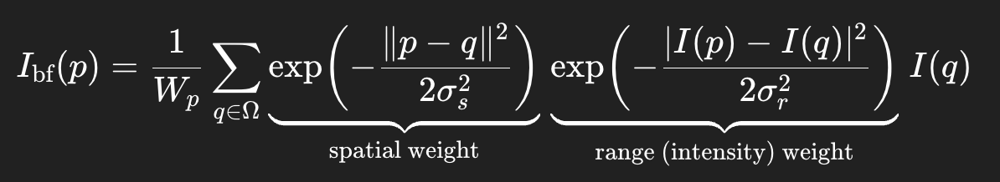

where ( $W_{p}$ ) is a normalization term that **also depends on image intensities**.

* In **linear filters** (e.g., Gaussian), the weights depend **only on spatial distance**.
* In **bilateral filtering**, the weights depend on:

  * spatial distance ( |p-q| )
  * **intensity difference ( |I(p) - I(q)| )**

Since the filter weights depend on the **input image values themselves**, the operation **cannot satisfy linearity**.

A linear system must satisfy:

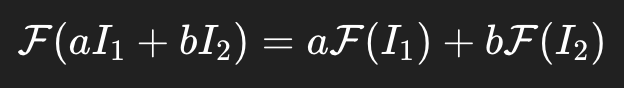


This fails for bilateral filtering because:

* The **range kernel changes** when pixel intensities change
* The normalization factor ( $W_{p}$ ) is **image-dependent**
* Therefore, scaling or adding images **changes the weights themselves**



### Exercise Solutions

---

#### 1. Spatial vs Frequency Domain Filtering

- Perform **spatial-domain filtering (convolution)** on an image using:
  - Box (uniform) filter  
  - Gaussian filter  

- Perform the **same filtering via frequency-domain multiplication**:
  - Take the Fourier transform of the image and of the filter  
  - Multiply them  
  - Apply the inverse FFT  

- Compare:
  - Spatial vs frequency-domain results (visual comparison and quantitative metrics like **MSE** or **PSNR**)  
  - Does the Fourier-domain implementation reproduce spatial convolution exactly?  
  - Explain differences if any

- Plot:
  - Magnitude spectrum of the Fourier transform (log magnitude / dB) for **Box filter** and **Gaussian filter**  
  - Discuss which filter is “better” and why, based on their frequency response.  

- Apply both filters to several test images:
  - Include at least one image with strong **high-frequency content** (e.g., checkerboard, text).  
  - Discuss differences (edge blurring, ringing artifacts, texture preservation, etc.).  

In [24]:
IMAGE_PATH = 'lena_gray (1).png'
img = load_gray_image(IMAGE_PATH)
np.random.seed(0)

(512, 512)


### Spatial-domain filtering (convolution)

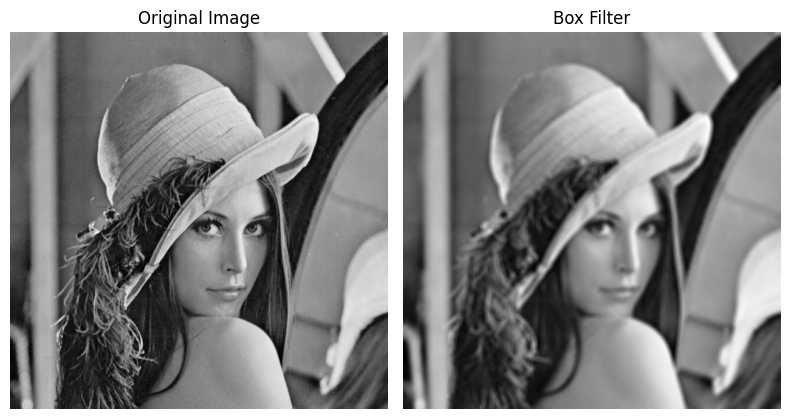

In [25]:
# box filter
N = 7
box_kernel = np.ones((N, N), dtype=np.float32) / (N*N)
img_box_spatial = convolve(img, box_kernel, mode='reflect')

fig, axes = plt.subplots(1, 2, figsize=(8, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(img_box_spatial, cmap='gray')
axes[1].set_title('Box Filter')
axes[1].axis('off')

plt.tight_layout()
plt.show()

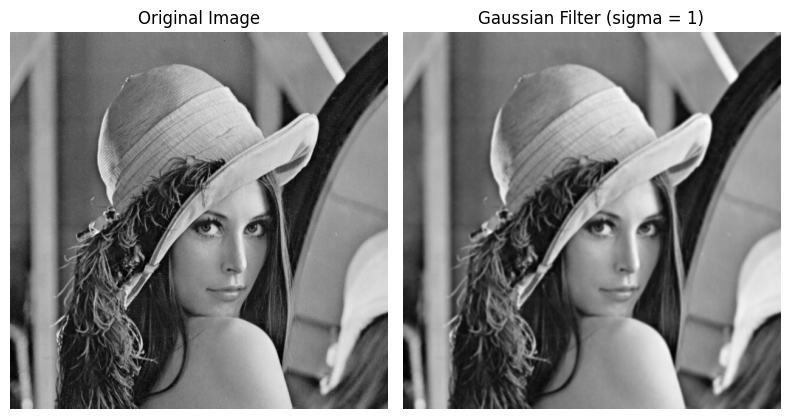

In [26]:
# gaussian fiter
sigma = 1
gauss_kernel = gaussian_kernel(N, sigma=sigma)
img_gauss_spatial = convolve(img, gauss_kernel, mode='reflect')

fig, axes = plt.subplots(1, 2, figsize=(8, 5))

axes[0].imshow(img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(img_gauss_spatial, cmap='gray')
axes[1].set_title(f'Gaussian Filter (sigma = {sigma})')
axes[1].axis('off')

plt.tight_layout()
plt.show()

### Frequency-domain multiplication

In [27]:
def freq_filter(img, kernel):
    H, W = img.shape
    # FFT of image
    F = np.fft.fft2(img)
    Fshift = np.fft.fftshift(F)
    # Pad kernel
    padded_kernel = np.zeros_like(img)
    kh, kw = kernel.shape
    padded_kernel[:kh, :kw] = kernel
    # Shift kernel to center
    padded_kernel = np.fft.ifftshift(padded_kernel)
    H_kernel = np.fft.fft2(padded_kernel)
    H_kernel = np.fft.fftshift(H_kernel)
    # Multiply
    G = Fshift * H_kernel
    # Inverse FFT
    g = np.fft.ifft2(np.fft.ifftshift(G))
    g = np.real(g)
    g = fftshift(g) # to get correct image patches (since we had some centering done)
    return g, padded_kernel


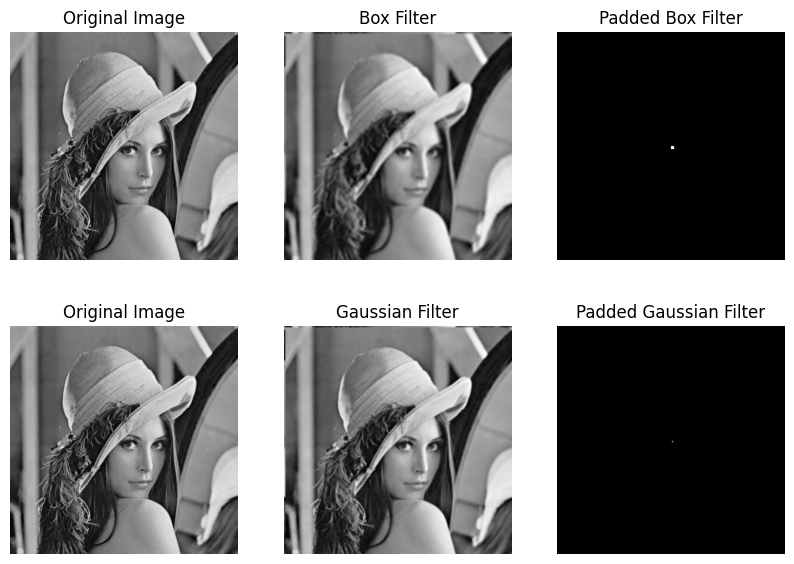

In [28]:
img_box_freq, pad_box_kernel = freq_filter(img, box_kernel)
img_gauss_freq, pad_gauss_kernel = freq_filter(img, gauss_kernel)

# let us plot and see the image result
fig, axes = plt.subplots(2, 3, figsize=(10, 7))

axes[0, 0].set_title('Original Image')
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].axis('off')

axes[0, 1].set_title('Box Filter')
axes[0, 1].imshow(img_box_freq, cmap='gray')
axes[0, 1].axis('off')

axes[0, 2].set_title('Padded Box Filter')
axes[0, 2].imshow(pad_box_kernel, cmap='gray')
axes[0, 2].axis('off')

axes[1, 0].set_title('Original Image')
axes[1, 0].imshow(img, cmap='gray')
axes[1, 0].axis('off')

axes[1, 1].set_title('Gaussian Filter')
axes[1, 1].imshow(img_gauss_freq, cmap='gray')
axes[1, 1].axis('off')

axes[1, 2].set_title('Padded Gaussian Filter')
axes[1, 2].imshow(pad_gauss_kernel, cmap='gray')
axes[1, 2].axis('off')

plt.show()

### Compare

In [29]:
def mse(a, b):
    return np.mean((a - b) ** 2)

print("Box MSE:", mse(img_box_spatial, img_box_freq))
print("Gaussian MSE:", mse(img_gauss_spatial, img_gauss_freq))


Box MSE: 0.0044265552
Gaussian MSE: 0.0075850138


Frequency-domain filtering reproduces spatial convolution almost exactly when done correctly (although, there can be small numerical precision error).
This is also proven theoretically.  
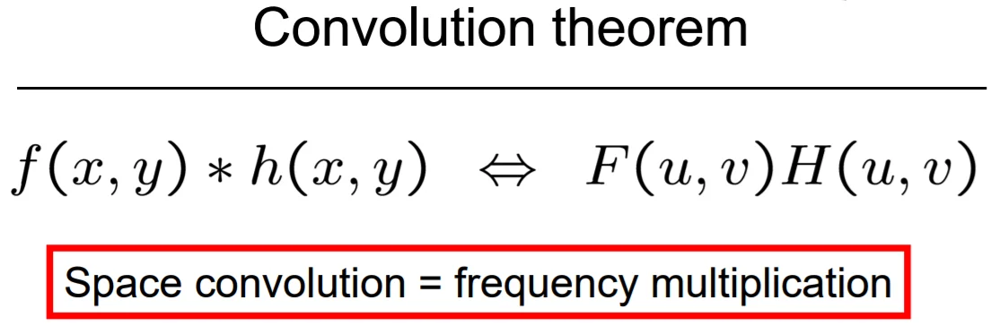

### Plotting spectrum

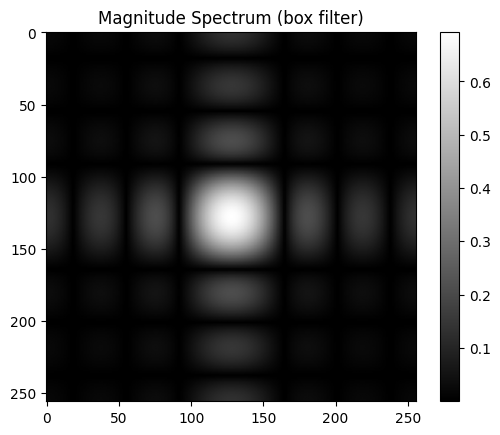

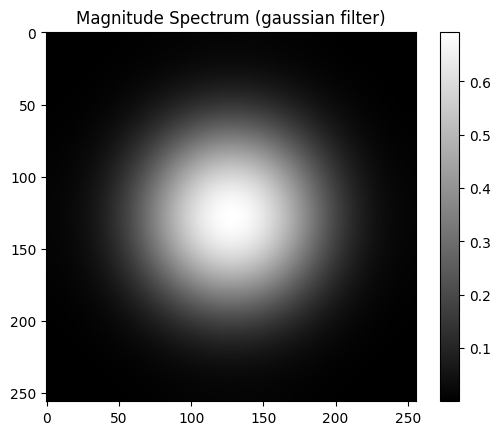

In [30]:
def plot_spectrum(kernel, name: str):
    pad = np.zeros((256, 256))
    kh, kw = kernel.shape
    pad[:kh, :kw] = kernel
    pad = np.fft.ifftshift(pad)

    H = np.fft.fftshift(np.fft.fft2(pad))
    plt.imshow(np.log(1 + np.abs(H)), cmap='gray')
    plt.title(f"Magnitude Spectrum ({name})")
    plt.colorbar()
    plt.show()

plot_spectrum(box_kernel, name="box filter")
plot_spectrum(gauss_kernel, name="gaussian filter")


| Filter   | Frequency Response  | Artifacts       |
| -------- | ------------------- | --------------- |
| Box      | Sharp cutoff (sinc) | Ringing         |
| Gaussian | Smooth decay        | Minimal ringing |

Gaussian is better for natural images.

### Filters on test images

In [31]:
def generate_chessboard(size=256, num_squares=8):
    # Pixel grid
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    # Size of each square
    square_size = size // num_squares

    # Alternating pattern using integer division
    board = ((X // square_size) + (Y // square_size)) % 2

    return board

test1 = generate_chessboard(size=256, num_squares=16)

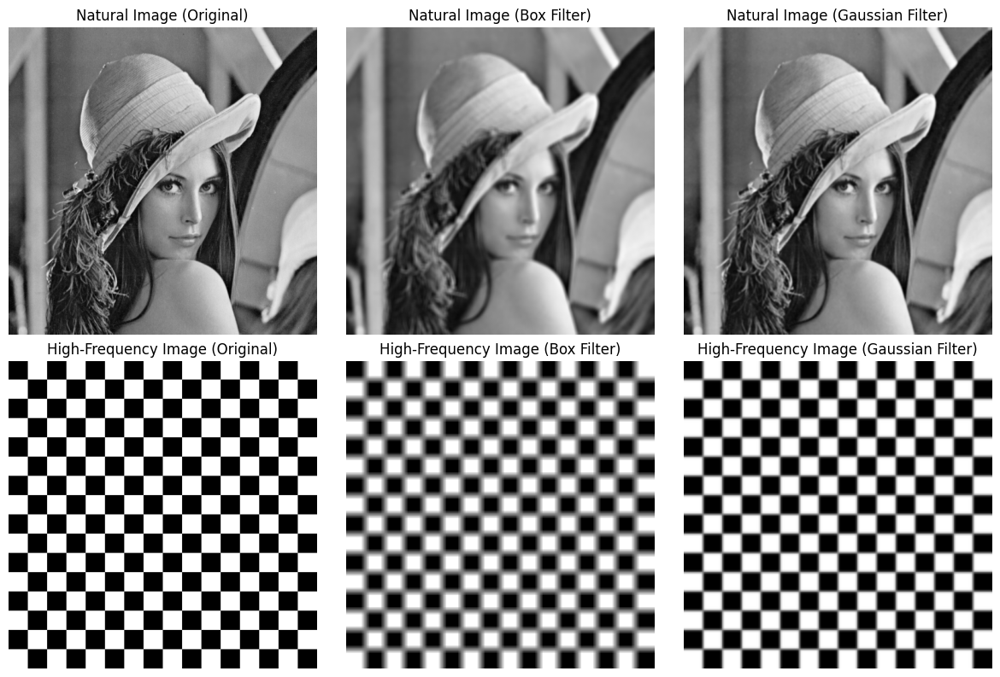

In [32]:
N = 7
box_kernel = np.ones((N, N), dtype=np.float32) / (N*N)
sigma = 1.0
gauss_kernel = gaussian_kernel(N, sigma=sigma)

img_f = img.astype(np.float32)
test1_f = test1.astype(np.float32)

# Natural image
img_box = convolve(img_f, box_kernel)
img_gauss = convolve(img_f, gauss_kernel)

# High-frequency image
test1_box = convolve(test1_f, box_kernel)
test1_gauss = convolve(test1_f, gauss_kernel)

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Natural image
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title("Natural Image (Original)")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_box, cmap='gray')
axes[0, 1].set_title("Natural Image (Box Filter)")
axes[0, 1].axis("off")

axes[0, 2].imshow(img_gauss, cmap='gray')
axes[0, 2].set_title("Natural Image (Gaussian Filter)")
axes[0, 2].axis("off")


# High-frequency image
axes[1, 0].imshow(test1, cmap='gray')
axes[1, 0].set_title("High-Frequency Image (Original)")
axes[1, 0].axis("off")

axes[1, 1].imshow(test1_box, cmap='gray')
axes[1, 1].set_title("High-Frequency Image (Box Filter)")
axes[1, 1].axis("off")

axes[1, 2].imshow(test1_gauss, cmap='gray')
axes[1, 2].set_title("High-Frequency Image (Gaussian Filter)")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

For the natural image (Lena):
+ The box filter produces noticeable edge blurring, particularly around the hat brim, facial contours, and hair strands, leading to loss of fine details.

+ The Gaussian filter, while also smoothing the image, preserves edges and textures more naturally, resulting in smoother intensity transitions and better visual quality.

For the high-frequency checkerboard image:
+ The box filter almost completely suppresses the alternating black-white pattern, yielding a nearly uniform image. This occurs because the box filter aggressively attenuates high-frequency components and introduces ringing due to its sinc-shaped frequency response.

+ The Gaussian filter attenuates high frequencies more gradually, allowing the checkerboard structure to remain partially visible without introducing oscillatory artifacts.

Overall, the Gaussian filter demonstrates superior edge behavior, reduced ringing, and better texture preservation compared to the box filter, especially for images containing strong high-frequency content.

#### 2. Fourier Transform of Simple and Real Images

- Take **5 images** of your choice:
  - **3 simple signals** (easy to compute Fourier transforms analytically)  
    - Examples: Rectangular box, Circular disk, Exponential decay, Circular ring, Single line, etc.  
  - **2 natural images** of your choice (e.g., low-light, noisy, rainy, etc.)  

- Tasks:
  - Compute and visualize their Fourier transforms.  
  - List observations about frequency content.  
  - (Tip: resize large images → Fourier transform is slow on large inputs).  

- Tasks:
  - Translate the image in spatial domain and check it's corresponding frequency domain
  - Rotate the image in spatial domain and check it's corresponding frequency domain


In [33]:
def compute_fft(image):
    F = np.fft.fft2(image)
    F_shift = np.fft.fftshift(F)
    magnitude = np.log(1 + np.abs(F_shift))
    return magnitude

def rectangular_box(size=256, box_size=80):
    img = np.zeros((size, size))
    start = size//2 - box_size//2
    end = start + box_size
    img[start:end, start:end] = 1.0
    return img

def single_line(size=256):
    img = np.zeros((size, size))
    img[:, size//2] = 1.0
    return img

def circular_disk(size=256, radius=40):
    y, x = np.ogrid[:size, :size]
    center = size // 2
    mask = (x - center)**2 + (y - center)**2 <= radius**2
    img = np.zeros((size, size))
    img[mask] = 1.0
    return img

In [35]:
# Simple images
img_box = rectangular_box()
img_line = single_line()
img_disk = circular_disk()

# Natural images
img_lena = img
img_rainy = load_gray_image('rainy_forest.jpg')     # high-frequency image


(512, 512)


In [36]:
fft_box = compute_fft(img_box)
fft_line = compute_fft(img_line)
fft_disk = compute_fft(img_disk)

fft_lena = compute_fft(img_lena)
fft_rainy = compute_fft(img_rainy)


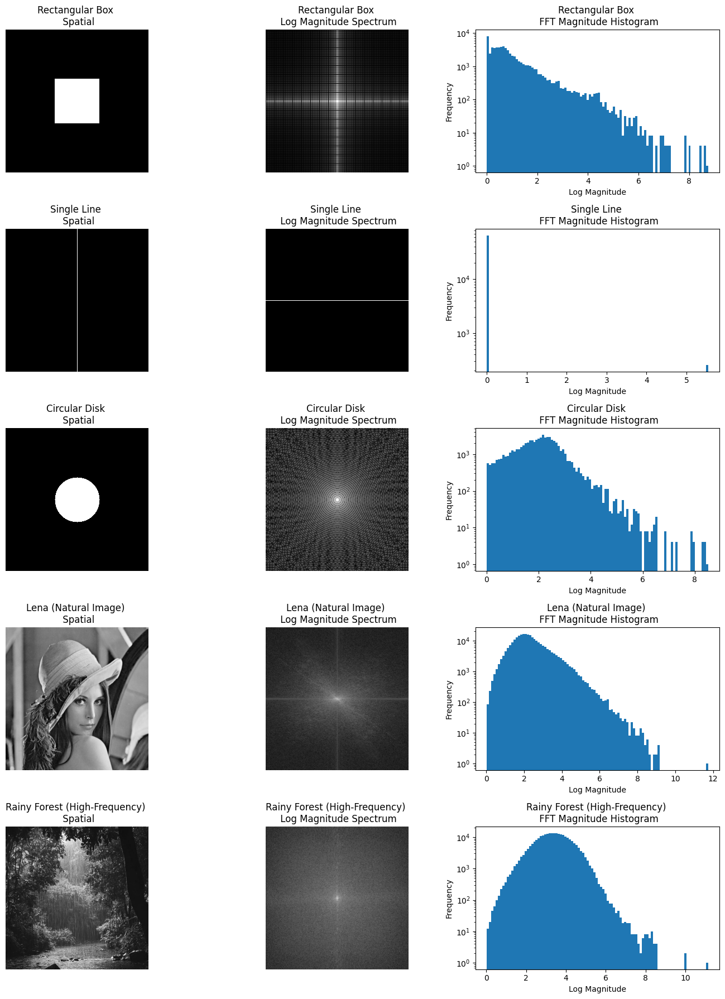

In [37]:
images = [
    (img_box, fft_box, "Rectangular Box"),
    (img_line, fft_line, "Single Line"),
    (img_disk, fft_disk, "Circular Disk"),
    (img_lena, fft_lena, "Lena (Natural Image)"),
    (img_rainy, fft_rainy, "Rainy Forest (High-Frequency)")
]

fig, axes = plt.subplots(len(images), 3, figsize=(14, 18))

for i, (spatial, fft_mag, title) in enumerate(images):
    # Spatial image
    axes[i, 0].imshow(spatial, cmap="gray")
    axes[i, 0].set_title(f"{title} \n Spatial")
    axes[i, 0].axis("off")

    # Fourier log-magnitude
    axes[i, 1].imshow(fft_mag, cmap="gray")
    axes[i, 1].set_title(f"{title} \n Log Magnitude Spectrum")
    axes[i, 1].axis("off")

    # Histogram of FFT magnitude
    axes[i, 2].hist(
        fft_mag.ravel(),
        bins=100,
        log=True
    )
    axes[i, 2].set_title(f"{title} \n FFT Magnitude Histogram")
    axes[i, 2].set_xlabel("Log Magnitude")
    axes[i, 2].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


### Rectangular Box

The rectangular box exhibits sharp spatial discontinuities, which result in a Fourier spectrum with strong central energy and pronounced horizontal and vertical sidelobes. The corresponding histogram shows a long-tailed distribution, indicating the presence of many high-magnitude frequency components generated by the abrupt edges.

---

### Single Line

The single vertical line is a highly directional structure in the spatial domain. Its Fourier transform concentrates energy along a horizontal line through the origin, demonstrating that frequency components are oriented perpendicular to the spatial structure. The histogram is highly sparse, with most values near zero and a few dominant peaks corresponding to the line’s strong frequency components.

---

### Circular Disk

The circular disk is radially symmetric, and this symmetry is preserved in the frequency domain. The Fourier spectrum displays concentric rings, characteristic of a Bessel-type response. The histogram reveals a broader but structured distribution, reflecting energy spread across multiple radial frequency bands due to the disk’s sharp boundary.

---

### Lena (Natural Image)

The natural image contains a mixture of smooth regions, edges, and textures. Its Fourier spectrum is dominated by low-frequency components near the center, with gradually decreasing energy toward higher frequencies. The histogram shows a heavy concentration at lower magnitudes with a long tail, indicating that most energy resides in low frequencies while edges contribute higher-frequency components.

---

### Rainy Forest (High-Frequency Natural Image)

The rainy forest image contains dense textures, fine details, and noise-like patterns. Its Fourier spectrum exhibits a wider spread of energy compared to the Lena image, extending further into higher frequencies. This is reflected in the histogram, which is broader and shifted toward higher magnitudes, confirming the presence of stronger high-frequency content.

---

We can conclude that sharp edges produce wide frequency spreads, directional patterns yield orthogonal spectral responses, and natural images concentrate energy in low frequencies with varying high-frequency tails depending on texture and noise.  

The histogram analysis provides quantitative support for the visual observations from the Fourier magnitude spectra.




NOTE- 0-filled translations and rotations lead to change in frequency signals due to introduction of black regions, so we perform a rolling shift and rotation.

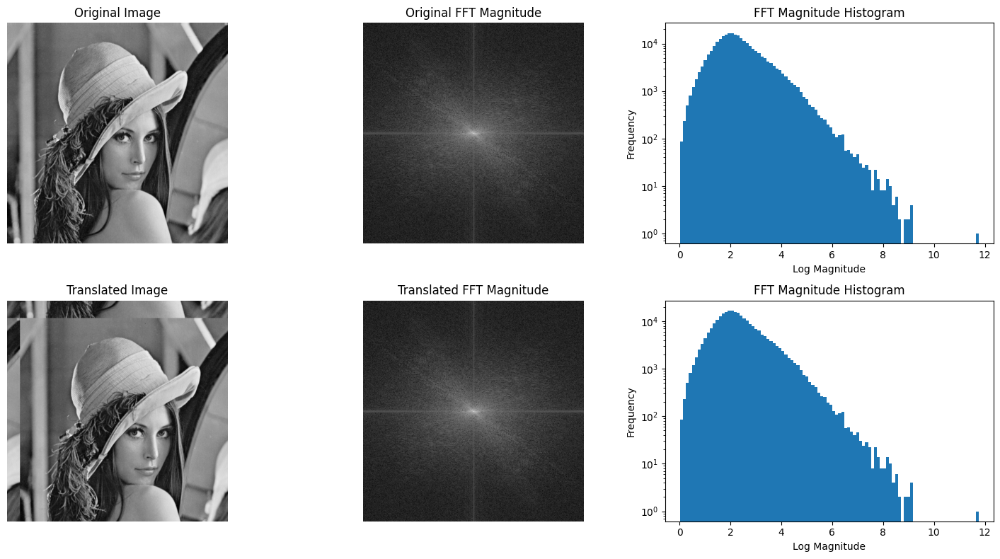

In [38]:
def translate_image(image, shift):
    dx, dy = shift
    return np.roll(np.roll(image, dx, axis=0), dy, axis=1)
# Example: use Lena
dx, dy = 40, 30
img_translated = translate_image(img_lena, (dx, dy))

fft_orig = compute_fft(img_lena)
fft_trans = compute_fft(img_translated)

# Plot
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(img_lena, cmap="gray")
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(fft_orig, cmap="gray")
axes[0, 1].set_title("Original FFT Magnitude")
axes[0, 1].axis("off")

axes[0, 2].hist(
        fft_orig.ravel(),
        bins=100,
        log=True
    )
axes[0, 2].set_title(f"FFT Magnitude Histogram")
axes[0, 2].set_xlabel("Log Magnitude")
axes[0, 2].set_ylabel("Frequency")

axes[1, 0].imshow(img_translated, cmap="gray")
axes[1, 0].set_title("Translated Image")
axes[1, 0].axis("off")

axes[1, 1].imshow(fft_trans, cmap="gray")
axes[1, 1].set_title("Translated FFT Magnitude")
axes[1, 1].axis("off")

axes[1, 2].hist(
        fft_trans.ravel(),
        bins=100,
        log=True
    )
axes[1, 2].set_title(f"FFT Magnitude Histogram")
axes[1, 2].set_xlabel("Log Magnitude")
axes[1, 2].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


+ Translating the image in the spatial domain does not alter the magnitude of its Fourier transform. The magnitude spectra before and after translation are identical, confirming that spatial shifts only introduce linear phase changes in the frequency domain.  
+ This demonstrates that phase encodes positional information, while magnitude captures frequency content.

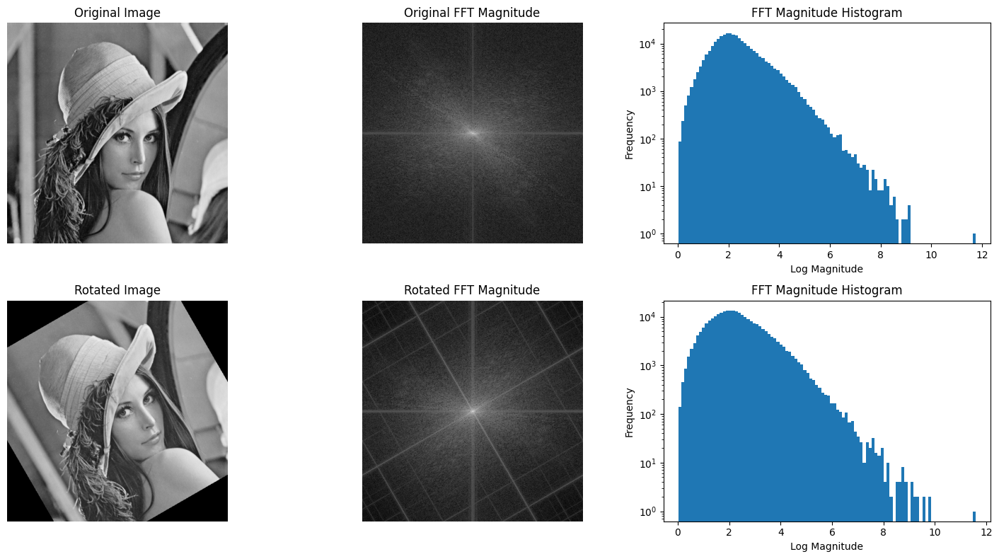

In [39]:
from scipy.ndimage import rotate
# Example: use Lena
angle_deg = 30
img_rot = rotate(img_lena, angle_deg, reshape=False)

fft_orig = compute_fft(img_lena)
fft_rot = compute_fft(img_rot)

# Plot
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(img_lena, cmap="gray")
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(fft_orig, cmap="gray")
axes[0, 1].set_title("Original FFT Magnitude")
axes[0, 1].axis("off")

axes[0, 2].hist(
        fft_orig.ravel(),
        bins=100,
        log=True
    )
axes[0, 2].set_title(f"FFT Magnitude Histogram")
axes[0, 2].set_xlabel("Log Magnitude")
axes[0, 2].set_ylabel("Frequency")

axes[1, 0].imshow(img_rot, cmap="gray")
axes[1, 0].set_title("Rotated Image")
axes[1, 0].axis("off")

axes[1, 1].imshow(fft_rot, cmap="gray")
axes[1, 1].set_title("Rotated FFT Magnitude")
axes[1, 1].axis("off")

axes[1, 2].hist(
        fft_rot.ravel(),
        bins=100,
        log=True
    )
axes[1, 2].set_title(f"FFT Magnitude Histogram")
axes[1, 2].set_xlabel("Log Magnitude")
axes[1, 2].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


+ Rotating the image in the spatial domain results in an equivalent rotation of its Fourier magnitude spectrum. The overall distribution of frequency energy remains unchanged, but its orientation rotates by the same angle.  
+ This confirms the rotational invariance property of the Fourier transform.

Conclusion
+ Spatial translation affects only the phase of the Fourier transform while leaving the magnitude unchanged.
+ Spatial rotation results in a corresponding rotation of the magnitude spectrum.  

Together, these results highlight the distinct roles of magnitude and phase in encoding frequency content and spatial structure.

#### 3. Frequency-Domain High-Pass Filtering

- Implement a **frequency-domain high-pass filter** defined as:  

  $$
  H_{\text{high-pass}}(u,v) = 1 - H_{\text{low-pass}}(u,v)
  $$

- Use low-pass filters:
  - Gaussian  
  - Box blur  

- Apply the high-pass filter to an image.  
- Add the filtered result back to the original image to observe **edge enhancement**.  

In [40]:
def gaussian_lowpass(shape, sigma):
    h, w = shape
    u = np.arange(h) - h // 2
    v = np.arange(w) - w // 2
    U, V = np.meshgrid(u, v, indexing="ij")
    D2 = U**2 + V**2
    H_lp = np.exp(-D2 / (2 * sigma**2))
    return H_lp

def box_lowpass(shape, cutoff):
    h, w = shape
    H_lp = np.zeros((h, w))
    c_h, c_w = h // 2, w // 2
    H_lp[
        c_h - cutoff : c_h + cutoff,
        c_w - cutoff : c_w + cutoff
    ] = 1
    return H_lp

def highpass_from_lowpass(H_lp):
    return 1 - H_lp

def apply_frequency_filter(img, H):
    F = np.fft.fft2(img)
    F_shift = np.fft.fftshift(F)

    F_filt = F_shift * H

    img_filt = np.fft.ifft2(np.fft.ifftshift(F_filt))
    return np.real(img_filt)


In [41]:
# Image (grayscale)
img = img_lena.astype(np.float32)
h, w = img.shape

# Gaussian HPF
H_lp_gauss = gaussian_lowpass((h, w), sigma=20)
H_hp_gauss = highpass_from_lowpass(H_lp_gauss)
img_hp_gauss = apply_frequency_filter(img, H_hp_gauss)

# Box HPF
H_lp_box = box_lowpass((h, w), cutoff=20)
H_hp_box = highpass_from_lowpass(H_lp_box)
img_hp_box = apply_frequency_filter(img, H_hp_box)

In [42]:
alpha = 1.5  # sharpening strength

sharp_gauss = img + alpha * img_hp_gauss
sharp_box = img + alpha * img_hp_box

sharp_gauss = np.clip(sharp_gauss, 0, 255)
sharp_box = np.clip(sharp_box, 0, 255)


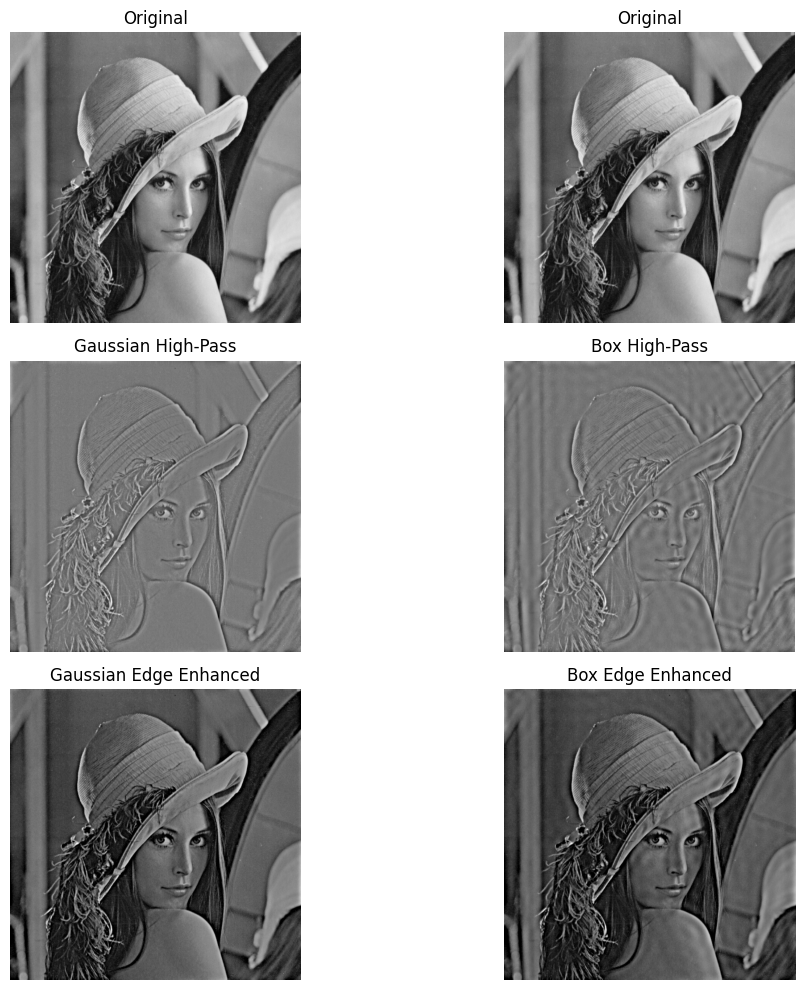

In [43]:
fig, axes = plt.subplots(3, 2, figsize=(12, 10))

# Original
axes[0,0].imshow(img, cmap="gray")
axes[0,0].set_title("Original")
axes[0,0].axis("off")

# High-pass outputs
axes[1,0].imshow(img_hp_gauss, cmap="gray")
axes[1,0].set_title("Gaussian High-Pass")
axes[1,0].axis("off")
axes[1,1].imshow(img_hp_box, cmap="gray")
axes[1,1].set_title("Box High-Pass")
axes[1,1].axis("off")

# Original
axes[0,1].imshow(img, cmap="gray")
axes[0,1].set_title("Original")
axes[0,1].axis("off")

# Sharpened images
axes[2,0].imshow(sharp_gauss, cmap="gray")
axes[2,0].set_title("Gaussian Edge Enhanced")
axes[2,0].axis("off")
axes[2,1].imshow(sharp_box, cmap="gray")
axes[2,1].set_title("Box Edge Enhanced")
axes[2,1].axis("off")


plt.tight_layout()
plt.show()


Frequency-domain high-pass filtering enhances edges by amplifying high-frequency components, with Gaussian filters providing smoother and more stable sharpening than box filters.